In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import numpy as np

# Prevents crashes when showing graphs
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
SIM_STEPS = 201

torch.manual_seed(42)
np.random.seed(42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [2]:
# Pre-Determined train/test/val split
train_sims = np.load("../train_sims.npy")
train_sims = train_sims[train_sims < 750]
val_sims = np.load("../val_sims.npy")
val_sims = val_sims[val_sims < 750]
test_sims = np.load("../test_sims.npy")
test_sims = test_sims[test_sims < 750]

# Get porosity phi
def get_phi(sim,step):
    return cv2.imread(f"../Data200x200_withinfo/Image-{sim}-{step}_phi.jpg", cv2.IMREAD_GRAYSCALE)

# Get pressure
def get_pres(sim,step):
    return cv2.imread(f"../Data200x200_withinfo/Image-{sim}-{step}_P.jpg", cv2.IMREAD_GRAYSCALE)

# Get conductivity K
def get_k(sim,step):
    return cv2.imread(f"../Data200x200_withinfo/Image-{sim}-{step}_K.jpg", cv2.IMREAD_GRAYSCALE)

# Get all 3 as a 3-channel matrix
def get_all(sim,step):
    return np.array((get_k(sim,step), get_pres(sim,step), get_phi(sim,step)), dtype=np.float32)

In [3]:
# Darcy loss function
def darcy_loss(model, inp):
    # Takes in the k,pres,phi and outputs the prediction across the image.
    inp = inp.requires_grad_(True)
    out = model(inp)
    # out is in order K,P,phi, (conductivity, pressure, porosity)

    # Impose high pressure along the entire upper line by setting the pressure channelt to 200.
    out[:, 1:2, 0, :] = 200

    # If we assume the output is in order k,pres,phi
    # pres_grad is the gradient of the pressure along the y and x directions as a tuple
    pres_grad = torch.gradient(out[:, 1:2], dim=(-2,-1))

    # get velocity by multiplying the gradient by the conductivity
    y_grad = pres_grad[0] * out[:, 0:1]
    x_grad = pres_grad[1] * out[:, 0:1]

    # compute the divergence by the second derivative of the gradients and adding them together
    yy_grad = torch.gradient(y_grad, spacing=(1,),dim=(-2,))[0]
    xx_grad = torch.gradient(x_grad, spacing=(1,),dim=(-1,))[0]
    final = yy_grad + xx_grad

    # total divergence should be 0
    loss = (final**2).mean()

    return loss, out

In [4]:
# Building Blocks of the Unet

class TwoConv(nn.Module):
    # Basic block with 2 convolutional layers, each with a batch norm and relu
    
    def __init__(self, in_channels, out_channels, no_end_relu=False):
        super().__init__()
        
        self.seq = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

        if no_end_relu:
            self.seq = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1),
            )

    def forward(self, inp):
        return self.seq(inp)

# A single conv layer that will increase the height and width of the matrix by 2 each.
class SmallUp(nn.Module):

    def __init__(self, channels):
        super().__init__()

        self.conv = nn.Conv2d(channels, channels, 3, 1, 2)

    def forward(self, inp):
        return F.relu(self.conv(inp))

# A single conv layer that will decrease the height and width of the matrix by 2 each.
class SmallDown(nn.Module):

    def __init__(self, channels):
        super().__init__()

        self.conv = nn.Conv2d(channels, channels, 3, 1, 0)

    def forward(self, inp):
        return F.relu(self.conv(inp))
    
# Applies two convolutional layers, then pools
class Downsample(nn.Module):
    
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv = TwoConv(in_channels, out_channels)
        self.pool = nn.MaxPool2d(2)

    def forward(self, inp):

        return self.pool(self.conv(inp))

# Upsamples and concatenates the upsampled matrix with the "across" then performs convolution on the result
class Upsample(nn.Module):

    def __init__(self, in_channels, out_channels, tweak=None):
        super().__init__()
        # Upsamples by 2x
        self.up = nn.ConvTranspose2d(in_channels, out_channels, 4, 2, 1)
        self.tweak = tweak
        self.conv_after = TwoConv(in_channels, out_channels)

    def forward(self, below, across):
        # First upsample by 2x
        upsampled = self.up(below)
        # If tweak is active, apply it first
        if not self.tweak == None:
            upsampled = self.tweak(upsampled)
        # Concatenate with the same size on the downswing of the unet
        concat = torch.concat((upsampled, across), dim=-3)
        # Convolute them together
        return self.conv_after(concat)
    
# Define the actual model used
class SmallUnet(nn.Module):
    
    def __init__(self):
        super().__init__()

        # Input is Nx3x200x200
        self.c1 = TwoConv(3, 8)
        self.d1 = Downsample(8,16) # 16x100x100
        self.d2 = Downsample(16,32) # 32x50x50
        self.su = nn.Sequential(
            SmallUp(32),
            SmallUp(32),
            SmallUp(32)
        ) # 3x56x56
        self.d3 = Downsample(32,64) # 64x28x28
        self.d4 = Downsample(64,128) # 128x14x14
        self.d5 = Downsample(128, 256) # 256x7x7

        # Now back up
        self.u1 = Upsample(256, 128) # 128x14x14
        self.u2 = Upsample(128, 64) # 64x28x28
        self.u3 = Upsample(64, 32, tweak=nn.Sequential(
            SmallDown(32),
            SmallDown(32),
            SmallDown(32)
        ))  # 32x50x50
        self.u4 = Upsample(32,16) # 16x100x100
        self.u5 = Upsample(16,8) # 8x200x200
        self.final = TwoConv(8, 3, no_end_relu=True)

    def forward(self, input):
        # Start with convolution, expand 3 channels to 8.
        # Then downsample 5 times, saving the result
        top = self.c1(input)
        x1 = self.d1(top)
        x2 = self.d2(x1)
        x3 = self.d3(self.su(x2)) # Here we upsample slightly so that we can downsample with less border artifacts
        x4 = self.d4(x3)
        x5 = self.d5(x4)
        # Now that we're at 256x7x7, we upsample from here.
        # At each layer with concatenate with the xi that is the same size as the up after upsampling.
        up = self.u1(x5, x4)
        up = self.u2(up, x3)
        up = self.u3(up, x2) # Again, a small downsample here to get back on the proper resolution
        up = self.u4(up, x1)
        up = self.u5(up, top)
        # One last convolution on the result to return to 3 channels from 8, leaving us with the proper 3x200x200
        return self.final(up)

In [5]:
class MaskedDataset(torch.utils.data.Dataset):

    def __init__(self,
                 sims,
                 unmask_size=20,
                 points = None,
                 block_size = 50,
                 reveal_strategy = "block",
                 n_points = 200,
                 radius = 2,
                 steps = None,
                 H=200,
                 W=200,
                 channels="all",
                 mixed=False,
                 types=None,
                 noise=5,
                 return_mask=False,                 # allows visualiztion of mask
                 reveal_dim=[[(0, 1)], [(0, 1)]],   # x,y range for disks to exist
                 jitter_std=0.0,                    # % each disk drifts from deterministic position
                 deterministic_mask=True,            # if True, mask is deterministic and noise is 0
                 future_delta=0
                 ):
        
        self.sims = sims
        self.points = points
        self.steps = steps
        self.size = unmask_size
        self.reveal_strategy = reveal_strategy
        self.block_size = block_size
        self.n_points = n_points
        self.radius = radius
        self.H, self.W = H, W
        self.channels = channels
        self.mixed = mixed
        self.types = types
        self.noise = noise
        self.return_mask = return_mask
        self.reveal_dim = reveal_dim
        self.jitter_std = jitter_std
        self.deterministic_mask = deterministic_mask
        self.future_delta = future_delta

    def _chan_idx(self):
        if self.channels == "all":
            return [0,1,2]
        elif self.channels == "K":
            return [0]
        elif self.channels == "P":
            return [1]
        elif self.channels == "phi":
            return [2]
        else:
            raise ValueError("channels must be 'all', 'K', 'P', or 'phi'")

    
    

    def __getitem__(self, index):
        
        # --- In Progress --- 

            # pick a valid step
        if not isinstance(self.steps, np.ndarray):
            max_start = SIM_STEPS - 1 - self.future_delta  # ensures step + delta ≤ 199
            step = np.random.randint(1, max_start + 1)  
        else:
            step = int(self.steps[index])
            max_start = SIM_STEPS - 1 - self.future_delta
            if step > max_start:
                step = max_start



        # if not type(self.steps) == np.ndarray:
        #     step = np.random.randint(1,200)
        # else:
        #     step = self.steps[index]



        # Create tensor for the target
        t_cur = torch.tensor(get_all(self.sims[index], step), dtype=torch.float32)

        # Create 0 matrix
        z = torch.zeros_like(t_cur)

        # build a boolean mask of revealed pixels, shape (H,W)
        mask = torch.zeros((self.H, self.W), dtype=torch.bool)

        chans = self._chan_idx()

        if self.reveal_strategy == "block":
            # choose top-left for the block
            if not type(self.points) == np.ndarray:
                i0 = np.random.randint(0, self.H - self.block_size + 1)
                j0 = np.random.randint(0, self.W - self.block_size + 1)
            else:
                i0, j0 = self.points[index]
                i0 = max(0, min(i0, self.H - self.block_size))
                j0 = max(0, min(j0, self.W - self.block_size))
            mask[i0:i0+self.block_size, j0:j0+self.block_size] = True

        elif self.reveal_strategy == "disks":

            # used for reveal_dim
            # map fraction [0,1] to pixel indices [0, N-1] in mask layer
            def _segments_to_indices(segments, N, pad=0):
                idxs = []
                for a, b in segments:
                    i0 = max(pad, int(round(a * (N - 1))))
                    i1 = min((N - 1) - pad, int(round(b * (N - 1))))
                    if i1 >= i0:
                        idxs.append(torch.arange(i0, i1 + 1, dtype=torch.long))
                if not idxs:
                    # fallback to full range
                    return torch.arange(pad, N - pad, dtype=torch.long)
                return torch.unique(torch.cat(idxs)).to(torch.long)

            row_fracs = self.reveal_dim[0] # e.g, [(0, 1)]
            col_fracs = self.reveal_dim[1] # e.g, [(0, 1)]
            row_allowed = _segments_to_indices(row_fracs, self.H, pad=self.radius)
            col_allowed = _segments_to_indices(col_fracs, self.W, pad=self.radius)

            # choose grid shape close to aspect ratio 
            # works with non-squares
            Hspan = (row_allowed[-1] - row_allowed[0] + 1) if len(row_allowed) > 0 else self.H
            Wspan = (col_allowed[-1] - col_allowed[0] + 1) if len(col_allowed) > 0 else self.W
            ratio = float(Wspan) / max(1.0, float(Hspan))
            ny = int(max(1, round(np.sqrt(self.n_points / max(1e-8, ratio)))))
            nx = int(max(1, round(self.n_points / ny)))
            while nx * ny < self.n_points:
                nx += 1

            # pick evenly spaced indices from rows/cols allowed
            def pick_lin_indices(allowed, k):
                if k <= 1:
                    return allowed[len(allowed)//2]
                pos = torch.linspace(0, len(allowed)-1, steps=k)
                idx = torch.round(pos).long()
                return allowed[idx]
            
            
            row_picks = pick_lin_indices(row_allowed, ny)
            col_picks = pick_lin_indices(col_allowed, nx)
            yy, xx = torch.meshgrid(row_picks, col_picks, indexing="ij")
            points = torch.stack([yy.reshape(-1), xx.reshape(-1)], dim=1) # (ny*nx, 2)
            
            # if more than n_points, subselect
            if points.shape[0] > self.n_points:
                sel_pos = torch.linspace(0, points.shape[0]-1, steps=self.n_points)
                sel_idx = torch.round(sel_pos).long()
                points = points[sel_idx]

            ii = points[:, 0]
            jj = points[:, 1]

            if not self.deterministic_mask:
                if self.jitter_std is not None and self.jitter_std > 0:
                    # convert std (like 0.01 of image size) to pixels
                    sigmaH = float(self.jitter_std) * self.H
                    sigmaW = float(self.jitter_std) * self.W
                    
                    # Add Gaussian noise in pixel units
                    ii = ii.to(torch.float32) + torch.randn_like(ii, dtype=torch.float32) * sigmaH
                    jj = jj.to(torch.float32) + torch.randn_like(jj, dtype=torch.float32) * sigmaW

                    # Round and clamp so they stay inside bounds
                    ii = ii.round().clamp(self.radius, self.H - 1 - self.radius).to(torch.long)
                    jj = jj.round().clamp(self.radius, self.W - 1 - self.radius).to(torch.long)




            yy, xx = torch.meshgrid(torch.arange(self.H), torch.arange(self.W), indexing="ij")
            for y0, x0 in zip(ii, jj):
                disk = (yy - int(y0))**2 + (xx - int(x0))**2 <= (self.radius**2)
                mask |= disk
        else:
            raise ValueError(f"Unknown reveal_strategy: {self.reveal_strategy}")
        

        obs = t_cur[chans].clone()
        # Add noise (0 - 255 scale)
        if self.noise is not None and self.noise > 0:
            sigma = float(self.noise)
            obs = obs + sigma * torch.randn_like(obs)
            obs.clamp_(0.0, 255.0)


        z[chans, :, :] = torch.where(mask, obs, torch.zeros_like(obs))








        # --- In Progress --- 

        if self.future_delta > 0:
            step_f = step + self.future_delta   
            t_label = torch.tensor(get_all(self.sims[index], step_f), dtype=torch.float32)
        else:
            t_label = t_cur.clone()



        if self.return_mask:
            return z,t_label, mask
        else:  
            return z,t_label
    
    def __len__(self):
        return self.sims.shape[0]


Here you can add tests to run, each one takes a whole train test cycle

In [6]:
test = [
    # "delta_1_short", "delta_5_medium", 
    # "delta_10_long", "delta_20_verylong", 
    # "delta_40_verylong", 
    "delta_60_verylong"
        ]
path = ""

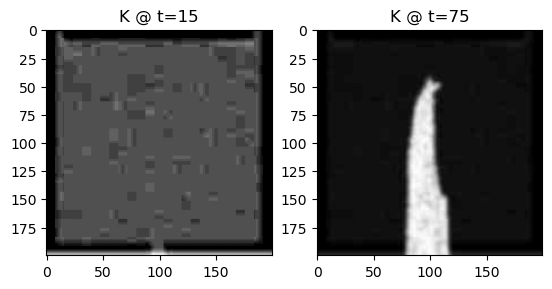

In [7]:
indices = [3]

name = "delta_60_verylong"


# --- load curves + meta ---
cur  = np.load(f"{path}curves_{name}.npz")
meta = np.load(f"{path}meta_{name}.npz", allow_pickle=True)

reveal_strategy   = str(meta["reveal_strategy"])
n_points          = int(meta["n_points"])
radius            = int(meta["radius"])
noise             = float(meta["noise"])
channels          = meta["channels"]
val_steps         = meta["val_steps"]
val_points        = meta["val_points"]
reveal_dim        = meta["reveal_dim"].tolist() if hasattr(meta["reveal_dim"], "tolist") else meta["reveal_dim"]
deterministic_mask= bool(meta["deterministic_mask_val"])
jitter_std        = float(meta["jitter_std_val"])
mixed             = bool(meta["mixed"])
future_delta      = int(meta["future_delta"]) if "future_delta" in meta.files else 60

torch.manual_seed(123); np.random.seed(123)

# rebuild validation dataset exactly as in training
val_data = MaskedDataset(
    val_sims,
    reveal_strategy=reveal_strategy,
    n_points=n_points,
    radius=radius,
    noise=noise,
    channels=channels,
    points=val_points,
    steps=val_steps,
    reveal_dim=reveal_dim,
    deterministic_mask=deterministic_mask,
    jitter_std=jitter_std,
    mixed=mixed,
    future_delta=future_delta,
)

# figure out which sim / timesteps each row uses
sim_ids      = []
start_steps  = []
future_steps = []

for idx in indices:
    sim = int(val_sims[idx])
    t   = int(val_steps[idx])
    t_f = min(SIM_STEPS - 1, t + future_delta)
    sim_ids.append(sim)
    start_steps.append(t)
    future_steps.append(t_f)






idx = indices[0]
sim  = int(val_sims[idx])
t    = int(val_steps[idx])
t_f  = min(SIM_STEPS - 1, t + future_delta)

img_t   = get_all(sim, t)
img_tf  = get_all(sim, t_f)

plt.subplot(1,2,1); plt.imshow(img_t[0], cmap="gray");  plt.title(f"K @ t={t}")
plt.subplot(1,2,2); plt.imshow(img_tf[0], cmap="gray"); plt.title(f"K @ t={t_f}")
plt.show()

In [8]:
def make_sample_for_sim_time(sim_id, t, meta, future_delta):
    """
    Build a single (z, t_label) pair for a specific sim and time t
    using the same config that was used during training.
    """
    reveal_strategy    = str(meta["reveal_strategy"])
    n_points           = int(meta["n_points"])
    radius             = int(meta["radius"])
    noise              = float(meta["noise"])
    channels           = meta["channels"]
    reveal_dim         = meta["reveal_dim"].tolist() if hasattr(meta["reveal_dim"], "tolist") else meta["reveal_dim"]
    deterministic_mask = bool(meta["deterministic_mask_val"])
    jitter_std         = float(meta["jitter_std_val"])
    mixed              = bool(meta["mixed"])

    # make sure t is valid for this delta
    SIM_STEPS = 201
    max_start = SIM_STEPS - 1 - future_delta   # same logic as in MaskedDataset
    t = min(int(t), max_start)

    ds = MaskedDataset(
        sims=np.array([sim_id]),
        reveal_strategy=reveal_strategy,
        n_points=n_points,
        radius=radius,
        noise=noise,
        channels=channels,
        points=None,                         # let it pick mask positions
        steps=np.array([t]),                 # <- force time t
        reveal_dim=reveal_dim,
        deterministic_mask=deterministic_mask,
        jitter_std=jitter_std,
        mixed=mixed,
        future_delta=future_delta,
    )

    z, t_label = ds[0]   # only one sample
    return z, t_label, t

In [9]:
def show_for_specific_times(model, trials, meta, future_delta=0):
    """
    trials: list of (sim_id, t) pairs.
    For each, show:
      - Full K @ t
      - Given K @ t (masked)
      - Pred K @ t+Δ
      - True K @ t+Δ
      - Full P @ t
      - Given P @ t (masked)
      - Pred P @ t+Δ
      - True P @ t+Δ
    """
    model.eval()
    n = len(trials)
    fig, axs = plt.subplots(n, 8, figsize=(12, 3*n), dpi=300)
    if n == 1:
        axs = np.expand_dims(axs, axis=0)

    d_txt = f"Δ={future_delta}"

    col_titles = [
        "Full K @ t",
        "Given K @ t (masked)",
        "Pred K @ t+Δ",
        "True K @ t+Δ",
        "Full P @ t",
        "Given P @ t (masked)",
        "Pred P @ t+Δ",
        "True P @ t+Δ",
    ]

    for j, title in enumerate(col_titles):
            axs[0, j].set_title(title, fontsize=8)

    fig.suptitle(f"Future prediction with {d_txt}", fontsize=20)

    SIM_STEPS = 201

    for row, (sim_id, t_raw) in enumerate(trials):
        # build sample from that sim/time using the same config
        z, t_label, t = make_sample_for_sim_time(sim_id, t_raw, meta, future_delta)

        t_f = min(SIM_STEPS - 1, t + future_delta)

        # full ground truth frames
        img_t  = get_all(sim_id, t)
        img_tf = get_all(sim_id, t_f)

        with torch.no_grad():
            out = model(z.to(device).unsqueeze(0))[0]

        # K channel
        axs[row,0].imshow(img_t[0],    cmap="gray", vmin=0, vmax=255)
        axs[row,1].imshow(z[0].cpu(),  cmap="gray", vmin=0, vmax=255)
        axs[row,2].imshow(out[0].cpu(),cmap="gray", vmin=0, vmax=255)
        axs[row,3].imshow(img_tf[0],   cmap="gray", vmin=0, vmax=255)

        # P channel
        axs[row,4].imshow(img_t[1],    cmap="gray", vmin=0, vmax=255)
        axs[row,5].imshow(z[1].cpu(),  cmap="gray", vmin=0, vmax=255)
        axs[row,6].imshow(out[1].cpu(),cmap="gray", vmin=0, vmax=255)
        axs[row,7].imshow(img_tf[1],   cmap="gray", vmin=0, vmax=255)

        # (optional) annotate row label
        axs[row,0].set_ylabel(f"sim {sim_id}, t={t}", fontsize=7)

    for ax in fig.get_axes():
        ax.axis("off")

    fig.tight_layout()
    plt.show()

In [16]:
tests = [
    # ---------- FULL FIELD REVEAL (for comparison) ----------
    # {
    #     "name": "full_d1_n16",
    #     "reveal_strategy": "disks",
    #     "n_points": 16,
    #     "radius": 5,
    #     "mixed": True,
    #     "noise": 5,
    #     "deterministic_mask": False,
    #     "jitter_std": 0.02,
    #     "reveal_dim": [[(0.0, 1.0)], [(0.0, 1.0)]],  # rows: all, cols: all
    #     "future_delta": 1,
    # },
    {
        "name": "full_d5_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.0, 1.0)], [(0.0, 1.0)]],
        "future_delta": 5,
    },
    {
        "name": "full_d10_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.0, 1.0)], [(0.0, 1.0)]],
        "future_delta": 10,
    },
    {
        "name": "full_d20_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.0, 1.0)], [(0.0, 1.0)]],
        "future_delta": 20,
    },

    # ---------- STRIP MASK (hide top 15% in K/P/phi) ----------
    # rows ∈ [0.15, 1.0], cols ∈ [0, 1.0]
    # {
    #     "name": "strip_d1_n16",
    #     "reveal_strategy": "disks",
    #     "n_points": 16,
    #     "radius": 5,
    #     "mixed": True,
    #     "noise": 5,
    #     "deterministic_mask": False,
    #     "jitter_std": 0.02,
    #     "reveal_dim": [[(0.15, 1.0)], [(0.0, 1.0)]],
    #     "future_delta": 1,
    # },
    {
        "name": "strip_d5_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.15, 1.0)], [(0.0, 1.0)]],
        "future_delta": 5,
    },
    {
        "name": "strip_d10_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.15, 1.0)], [(0.0, 1.0)]],
        "future_delta": 10,
    },
    {
        "name": "strip_d20_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.15, 1.0)], [(0.0, 1.0)]],
        "future_delta": 20,
    },
]


tests += [
    # ---------- FULL FIELD REVEAL (for comparison) ----------
    # {
    #     "name": "full_d1_n16",
    #     "reveal_strategy": "disks",
    #     "n_points": 16,
    #     "radius": 5,
    #     "mixed": True,
    #     "noise": 5,
    #     "deterministic_mask": False,
    #     "jitter_std": 0.02,
    #     "reveal_dim": [[(0.0, 1.0)], [(0.0, 1.0)]],  # rows: all, cols: all
    #     "future_delta": 1,
    # },
    {
        "name": "full_d5_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.0, 1.0)], [(0.0, 1.0)]],
        "future_delta": 5,
    },
    {
        "name": "full_d10_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.0, 1.0)], [(0.0, 1.0)]],
        "future_delta": 10,
    },
    {
        "name": "full_d20_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.0, 1.0)], [(0.0, 1.0)]],
        "future_delta": 20,
    },

    # ---------- STRIP MASK (hide top 15% in K/P/phi) ----------
    # rows ∈ [0.15, 1.0], cols ∈ [0, 1.0]
    # {
    #     "name": "strip_d1_n16",
    #     "reveal_strategy": "disks",
    #     "n_points": 16,
    #     "radius": 5,
    #     "mixed": True,
    #     "noise": 5,
    #     "deterministic_mask": False,
    #     "jitter_std": 0.02,
    #     "reveal_dim": [[(0.15, 1.0)], [(0.0, 1.0)]],
    #     "future_delta": 1,
    # },
    {
        "name": "strip_d5_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.15, 1.0)], [(0.0, 1.0)]],
        "future_delta": 5,
    },
    {
        "name": "strip_d10_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.15, 1.0)], [(0.0, 1.0)]],
        "future_delta": 10,
    },
    {
        "name": "strip_d20_n16",
        "reveal_strategy": "disks",
        "n_points": 16,
        "radius": 5,
        "mixed": True,
        "noise": 5,
        "deterministic_mask": False,
        "jitter_std": 0.02,
        "reveal_dim": [[(0.15, 1.0)], [(0.0, 1.0)]],
        "future_delta": 20,
    },
    # {
    #     "name": "delta_60_verylong",
    #     "future_delta": 60,
    # },
    # {
    #     "name": "delta_40_verylong",
    #     "future_delta": 40,
    # },
    # {
    #     "name": "delta_20_verylong",
    #     "future_delta": 20,
    # },
]

full_d5_n16


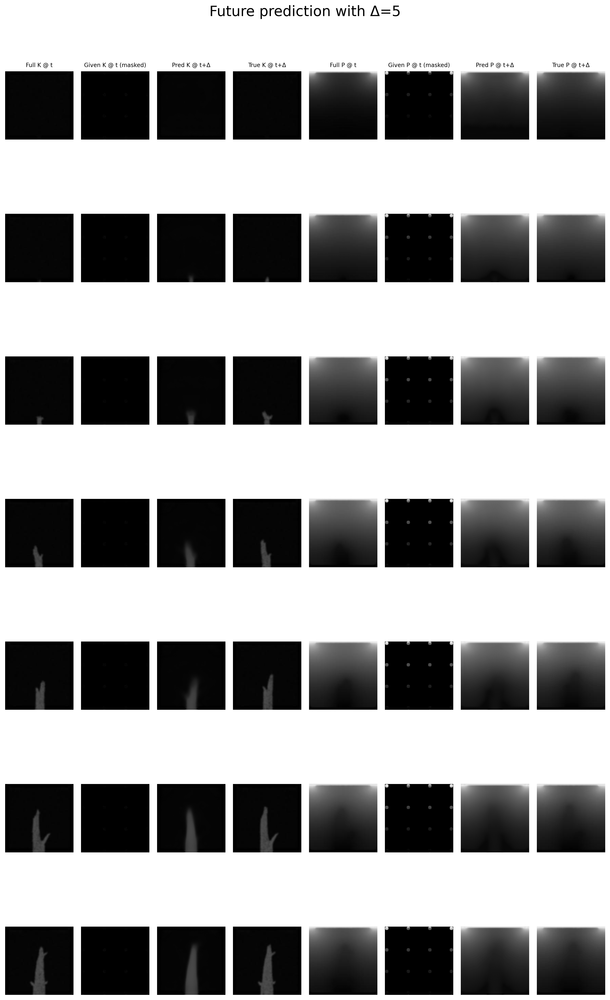

full_d10_n16


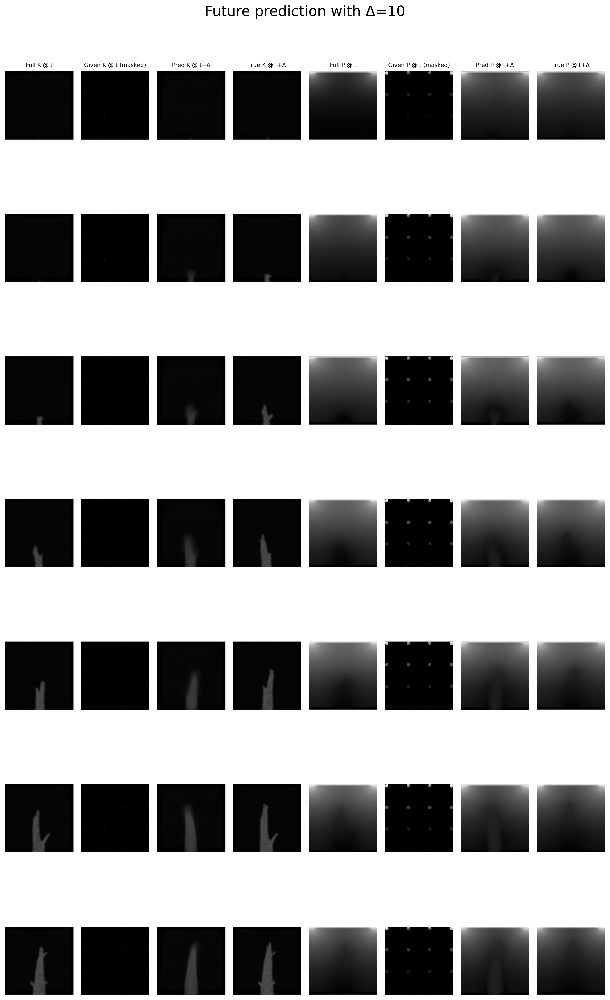

full_d20_n16


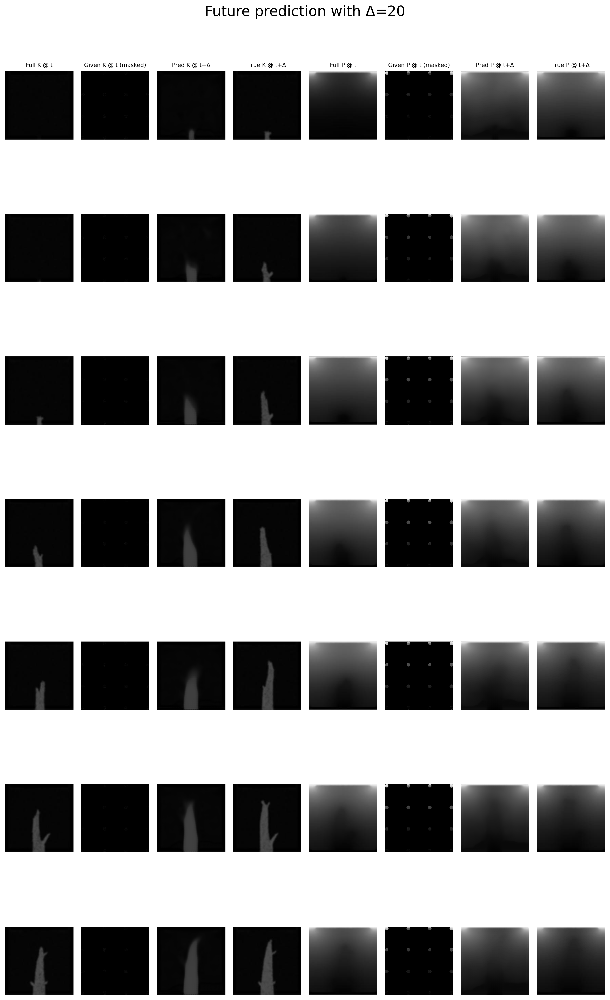

strip_d5_n16


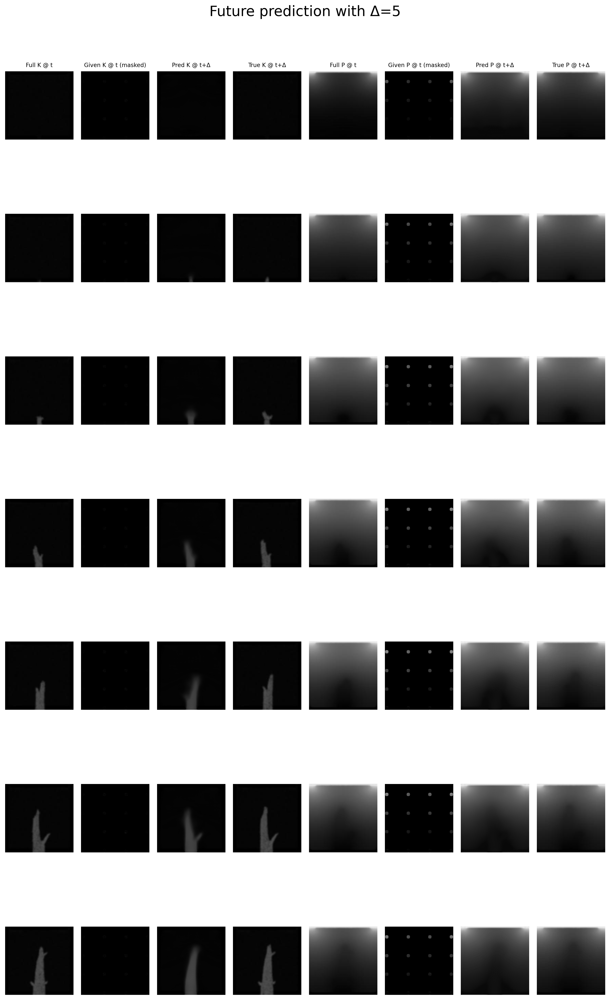

strip_d10_n16


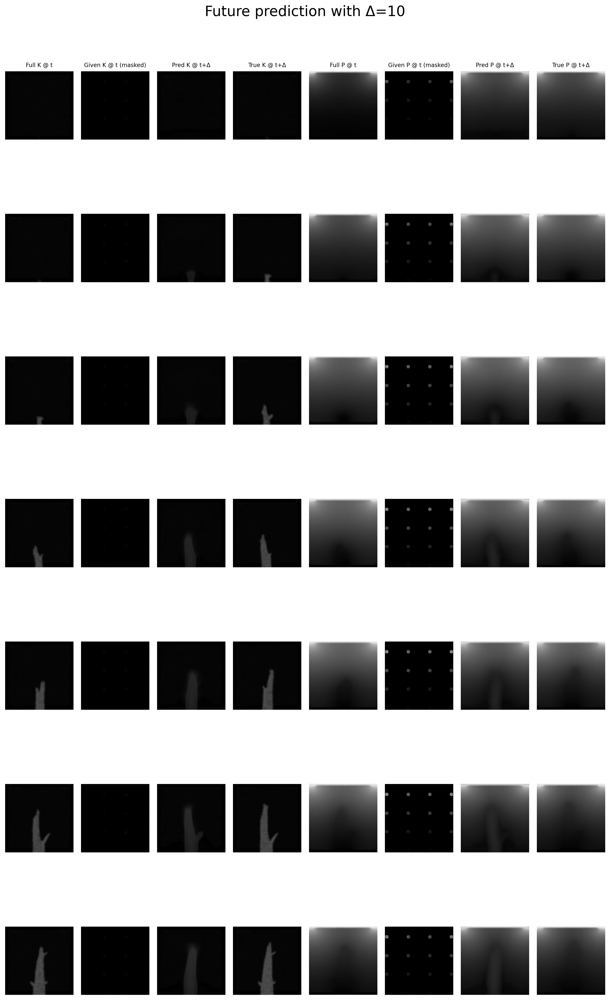

strip_d20_n16


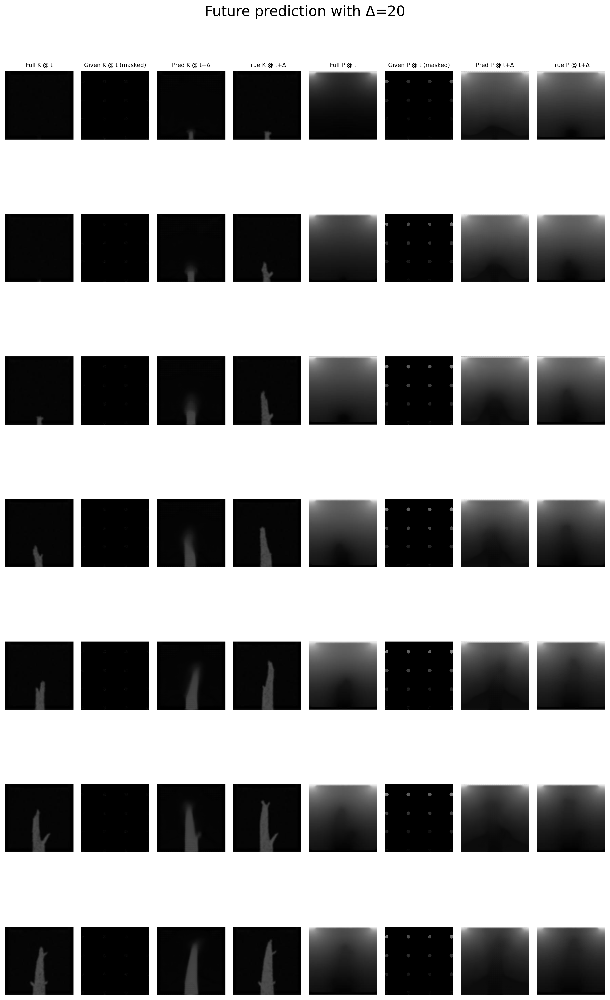

full_d5_n16


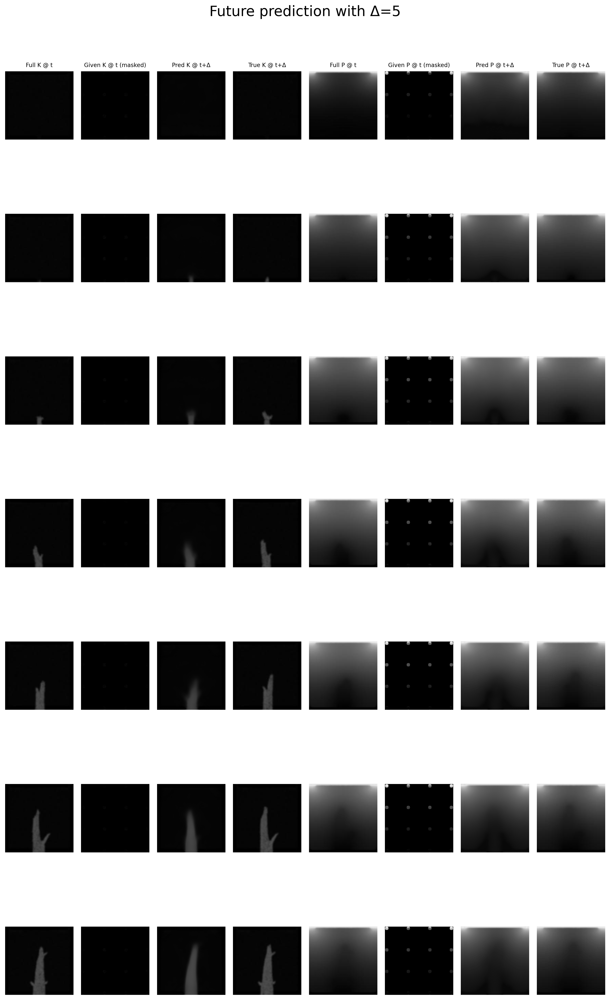

full_d10_n16


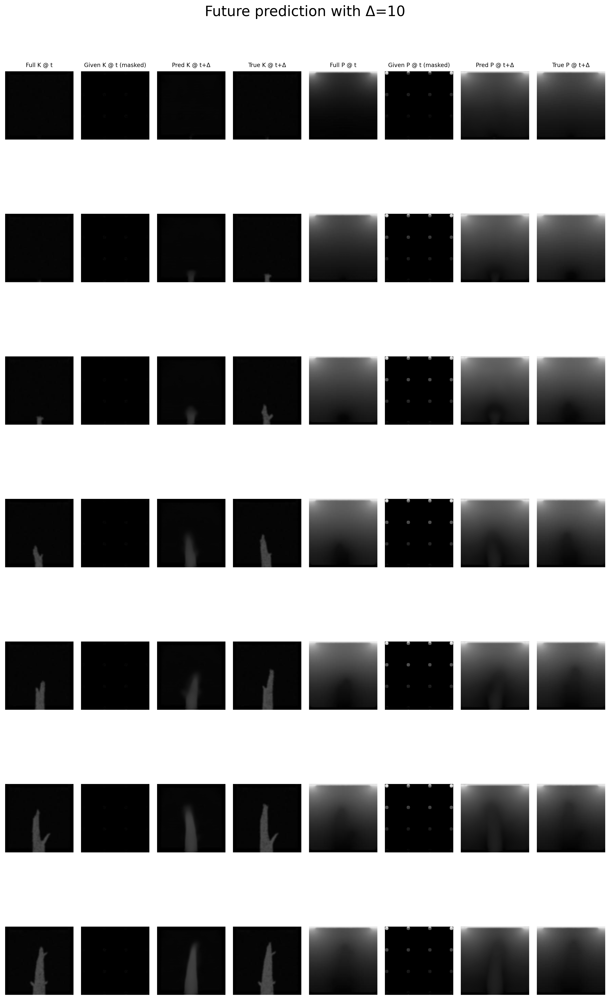

full_d20_n16


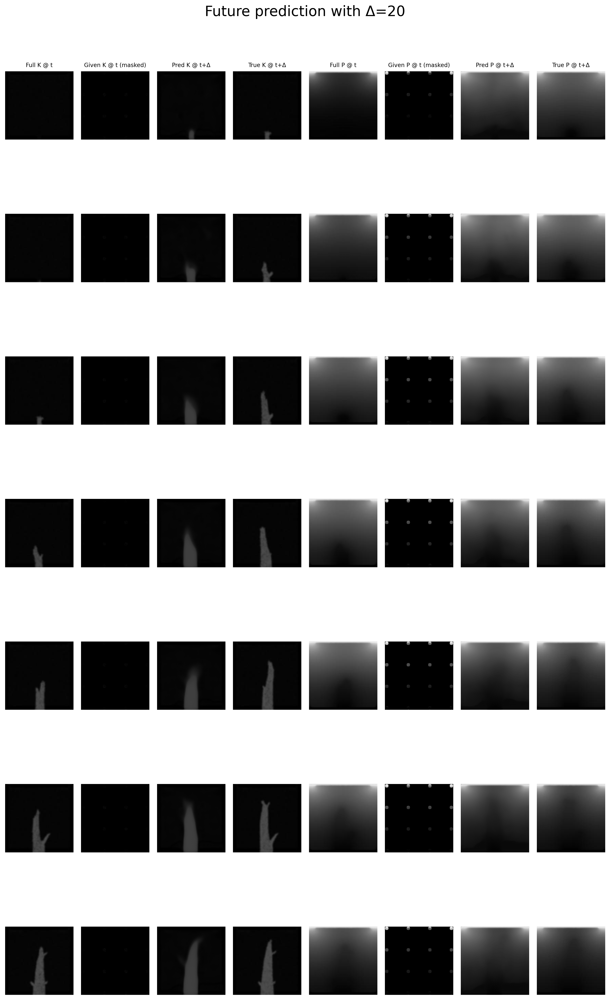

strip_d5_n16


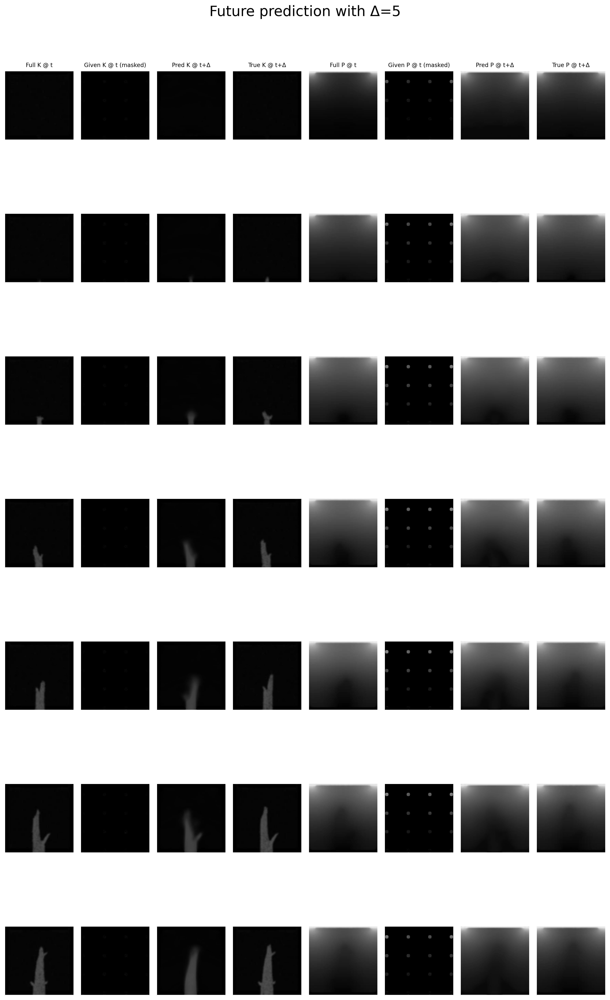

strip_d10_n16


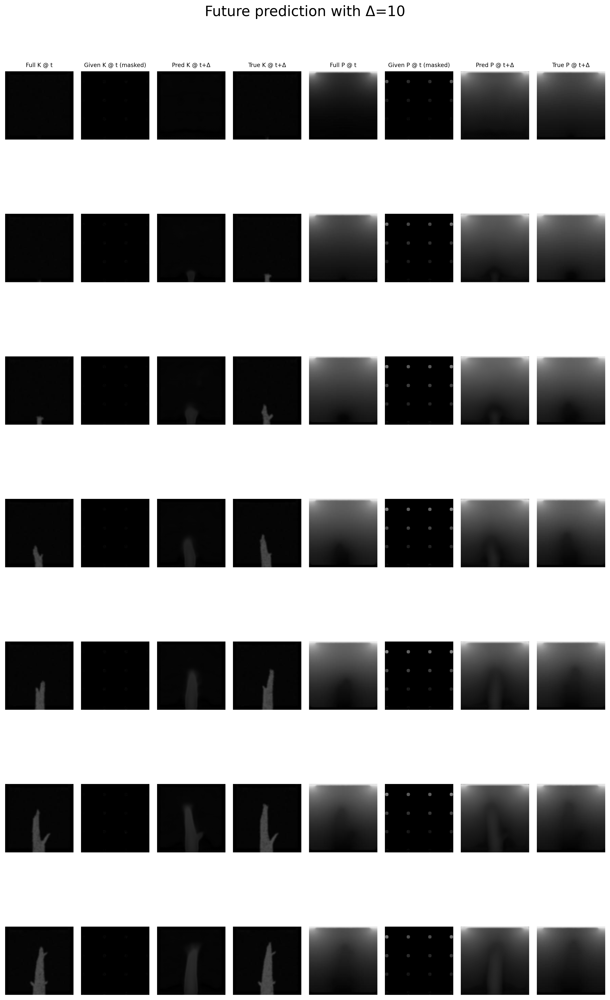

strip_d20_n16


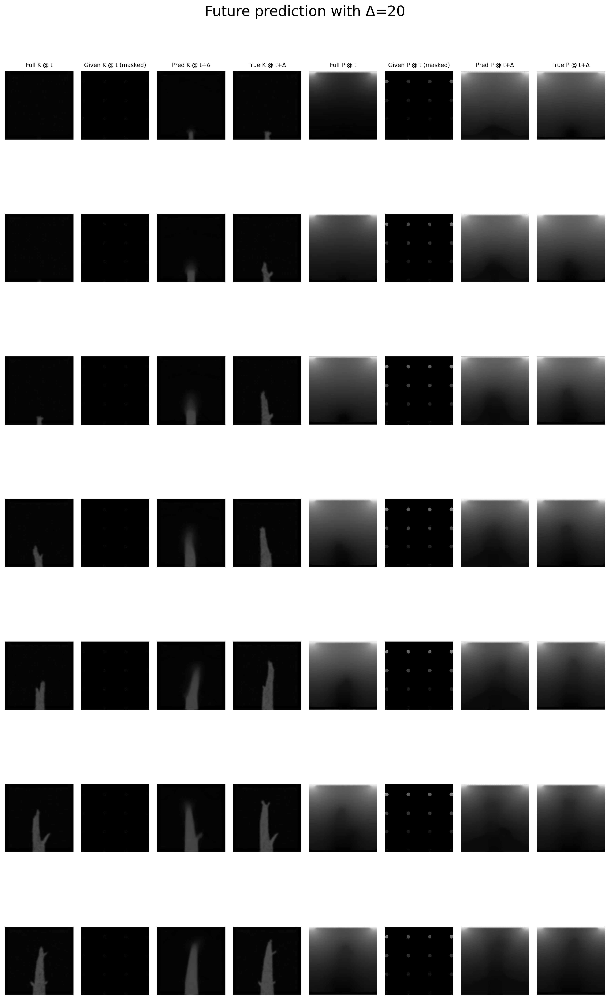

delta_60_verylong


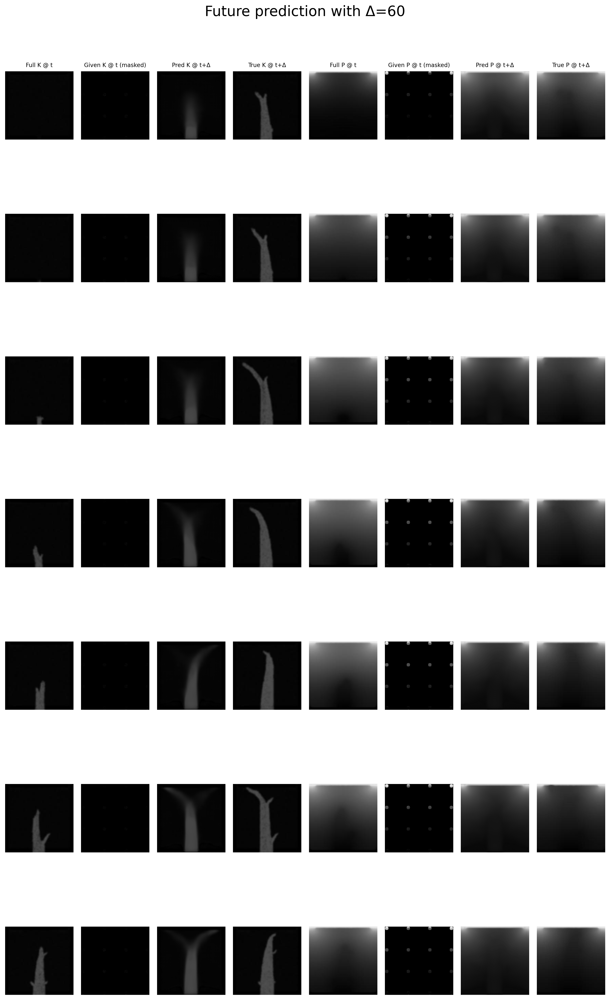

delta_40_verylong


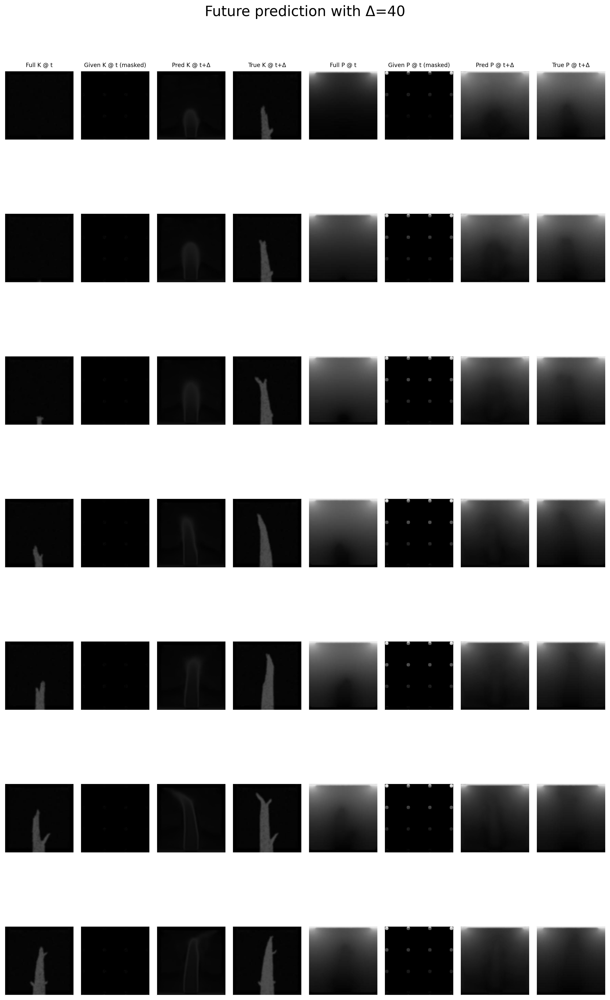

delta_20_verylong


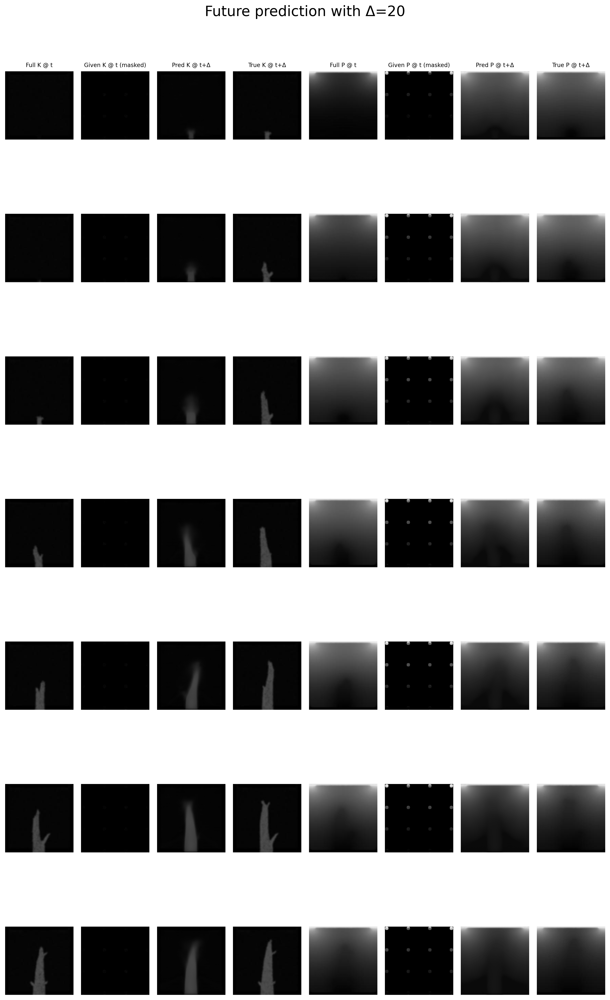

In [15]:
for test in tests:
    name = test["name"]
    print(name)
    path = "" 

    meta = np.load(f"{path}meta_{name}.npz", allow_pickle=True)
    future_delta = int(meta["future_delta"]) if "future_delta" in meta.files else test["future_delta"]

    model = torch.load(f"{path}{name}.pt", weights_only=False, map_location=torch.device("cpu")).to(device)

    trials = [
        (253, 10),   # sim 253 at t=20
        (253, 20),   # same sim at t=80
        (253, 30),
        (400, 40),
        (123, 50),
        (334, 60),
        (98, 70),

    ]

    show_for_specific_times(model, trials, meta, future_delta=future_delta)

In [12]:
from torch.utils.data import DataLoader
import torch.nn.functional as F

def build_val_dataset_from_meta(meta):
    reveal_strategy   = str(meta["reveal_strategy"])
    n_points          = int(meta["n_points"])
    radius            = int(meta["radius"])
    noise             = float(meta["noise"])
    channels          = meta["channels"]
    val_steps         = meta["val_steps"]
    val_points        = meta["val_points"]
    reveal_dim        = meta["reveal_dim"].tolist() if hasattr(meta["reveal_dim"], "tolist") else meta["reveal_dim"]
    deterministic_mask= bool(meta["deterministic_mask_val"])
    jitter_std        = float(meta["jitter_std_val"])
    mixed             = bool(meta["mixed"])
    future_delta      = int(meta["future_delta"]) if "future_delta" in meta.files else 0

    # assumes val_sims is defined globally, same as during training
    val_data = MaskedDataset(
        val_sims,
        reveal_strategy=reveal_strategy,
        n_points=n_points,
        radius=radius,
        noise=noise,
        channels=channels,
        points=val_points,
        steps=val_steps,
        reveal_dim=reveal_dim,
        deterministic_mask=deterministic_mask,
        jitter_std=jitter_std,
        mixed=mixed,
        future_delta=future_delta,
    )

    return val_data

In [13]:
def numerical_eval_model(model, meta, batch_size=16):
    model.eval()

    val_data   = build_val_dataset_from_meta(meta)
    val_loader = DataLoader(val_data, batch_size=batch_size)

    total_sq_all = 0.0
    total_sq_k   = 0.0
    total_sq_p   = 0.0
    total_pix_all = 0
    total_pix_kp  = 0   # K and P both have same number of pixels

    with torch.no_grad():
        for z, t_label in val_loader:
            z       = z.to(device)
            t_label = t_label.to(device)

            out = model(z)

            # shape: (B, C, H, W)
            B, C, H, W = out.shape

            # ---- overall MSE (all channels) ----
            diff_all = out - t_label
            total_sq_all  += (diff_all ** 2).sum().item()
            total_pix_all += B * C * H * W

            # ---- per-channel MSE for K and P ----
            # assuming channel 0 = K, 1 = P
            diff_k = out[:, 0] - t_label[:, 0]
            diff_p = out[:, 1] - t_label[:, 1]

            total_sq_k   += (diff_k ** 2).sum().item()
            total_sq_p   += (diff_p ** 2).sum().item()
            total_pix_kp += B * H * W

    mse_all = total_sq_all / total_pix_all
    mse_k   = total_sq_k   / total_pix_kp
    mse_p   = total_sq_p   / total_pix_kp

    return {
        "mse_all": mse_all,
        "mse_k":   mse_k,
        "mse_p":   mse_p,
    }

In [17]:
results = {}

for test in tests:
    name = test["name"]
    path = ""

    print(f"Evaluating {name}...")

    meta   = np.load(f"{path}meta_{name}.npz", allow_pickle=True)
    model  = torch.load(f"{path}{name}.pt", weights_only=False, map_location=torch.device("cpu")).to(device)

    metrics = numerical_eval_model(model, meta)
    results[name] = metrics

    print(f"  mse_all = {metrics['mse_all']:.6f}, "
          f"mse_k = {metrics['mse_k']:.6f}, "
          f"mse_p = {metrics['mse_p']:.6f}")

Evaluating full_d5_n16...
  mse_all = 121.134624, mse_k = 45.611863, mse_p = 40.238632
Evaluating full_d10_n16...
  mse_all = 128.550847, mse_k = 52.744900, mse_p = 61.975332
Evaluating full_d20_n16...
  mse_all = 178.605790, mse_k = 76.654675, mse_p = 74.861845
Evaluating strip_d5_n16...
  mse_all = 110.217046, mse_k = 37.975282, mse_p = 29.965519
Evaluating strip_d10_n16...
  mse_all = 136.380025, mse_k = 108.264697, mse_p = 66.921790
Evaluating strip_d20_n16...
  mse_all = 145.283253, mse_k = 52.474821, mse_p = 54.683986
Evaluating full_d5_n16...
  mse_all = 121.104189, mse_k = 45.742226, mse_p = 40.400930
Evaluating full_d10_n16...
  mse_all = 128.749654, mse_k = 52.950960, mse_p = 61.667060
Evaluating full_d20_n16...
  mse_all = 175.995319, mse_k = 75.514573, mse_p = 71.253118
Evaluating strip_d5_n16...
  mse_all = 109.440085, mse_k = 37.489856, mse_p = 29.971768
Evaluating strip_d10_n16...
  mse_all = 136.634298, mse_k = 108.553340, mse_p = 66.537555
Evaluating strip_d20_n16...
 

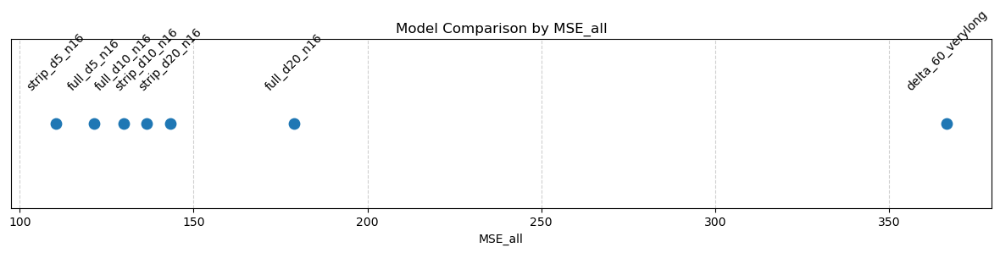

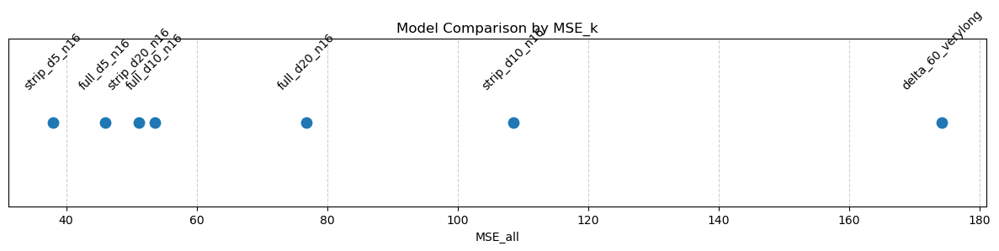

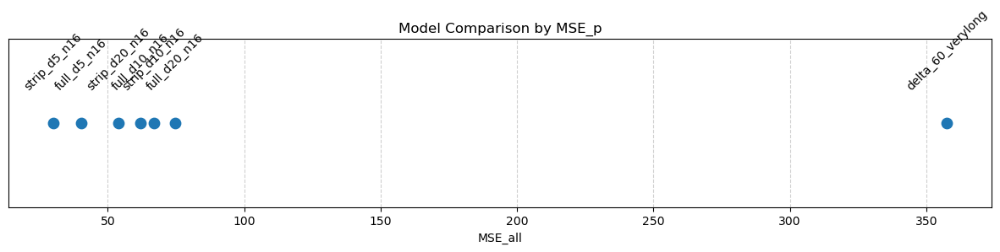

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

names = list(results.keys())
values = [results[name]["mse_all"] for name in names]

plt.figure(figsize=(12, 3))

y = np.zeros_like(values)

plt.scatter(values, y, s=80)

# Add text labels slightly above each point
for x, label in zip(values, names):
    plt.text(x, 0.02, label, ha='center', va='bottom', fontsize=10, rotation=45)

plt.title("Model Comparison by MSE_all")
plt.xlabel("MSE_all")
plt.yticks([])  # remove y-axis
plt.grid(axis='x', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()








values = [results[name]["mse_k"] for name in names]

plt.figure(figsize=(12, 3))

plt.scatter(values, y, s=80)

# Add text labels slightly above each point
for x, label in zip(values, names):
    plt.text(x, 0.02, label, ha='center', va='bottom', fontsize=10, rotation=45)

plt.title("Model Comparison by MSE_k")
plt.xlabel("MSE_all")
plt.yticks([])  # remove y-axis
plt.grid(axis='x', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()



values = [results[name]["mse_p"] for name in names]

plt.figure(figsize=(12, 3))

plt.scatter(values, y, s=80)

# Add text labels slightly above each point
for x, label in zip(values, names):
    plt.text(x, 0.02, label, ha='center', va='bottom', fontsize=10, rotation=45)

plt.title("Model Comparison by MSE_p")
plt.xlabel("MSE_all")
plt.yticks([])  # remove y-axis
plt.grid(axis='x', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()